In [1]:
%load_ext autoreload

%matplotlib inline
%autoreload 2

In [2]:
import os
from model.utils.center_tool import generate_map
import matplotlib.pyplot as plt
import matplotlib
from utils import array_tool as at
from matplotlib.patches import Rectangle
import data.voc_dataset as dv
from tqdm.notebook import tqdm

# import tqdm.notebook.tqdm as tqdm
from utils.config import opt
from data.dataset import Dataset, TestDataset, inverse_normalize
from model import FasterRCNNVGG16
from torch.utils import data as data_
from trainer import FasterRCNNTrainer
import torch
import resource
import logging
import time
import warnings
import numpy as np
import pickle
import gzip

In [22]:
# def generate():
#     opt._parse(kwargs)

dataset = Dataset(opt)    
dataloader = data_.DataLoader(dataset, \
                              batch_size=1, \
                              shuffle=False, \
                              pin_memory=True,
                              num_workers=1)



In [30]:
dataset.db.ids[1044]

'002873'

In [5]:
device='cpu'

In [6]:
faster_rcnn = FasterRCNNVGG16()
trainer = FasterRCNNTrainer(faster_rcnn).to(device)

In [7]:
load_path = 'checkpoints/fasterrcnn_06271437_0.6936766760275197'
if load_path:
    trainer.load(load_path, device=device)
    print('load pretrained model from %s' % load_path)

load pretrained model from checkpoints/fasterrcnn_06271437_0.6936766760275197


In [14]:
count_threshold = 30
type=f'fusion_cutmix_{count_threshold}_all_data_pic-per-image'

In [15]:
path = os.path.join("cutmix_data",type)
if not os.path.exists(path):
    os.mkdir(path)    

In [8]:
saved = []
for i in open("cutmix_data/data.txt").readlines():  
    saved.append(int(i.split("_")[1].strip()))    
print(saved)

[0, 1000, 1001, 1002, 1003, 1004, 1005, 1008, 1014, 1016, 1017, 1019, 1020, 1024, 1025, 1028, 1029, 103, 1034, 1035, 1037, 1039, 1043, 1044, 1045, 1046, 1050, 1051, 1053, 1058, 1062, 1067, 1068, 1077, 108, 1080, 1092, 1096, 1097, 1098, 1103, 1105, 1110, 1111, 1112, 1113, 1117, 1121, 1127, 1143, 1145, 1146, 1148, 115, 1152, 1153, 1154, 1158, 1161, 1162, 1167, 1168, 1169, 117, 1170, 1172, 1174, 1175, 1179, 118, 1180, 1181, 1184, 1186, 1187, 1190, 1192, 1198, 1204, 1205, 1209, 1210, 1215, 1217, 122, 1220, 1223, 1225, 1227, 1228, 123, 1231, 1236, 1237, 1238, 1240, 1247, 125, 1253, 1255, 1257, 1262, 1263, 1264, 1265, 1266, 1272, 1273, 1277, 1278, 128, 1289, 1290, 1292, 1294, 1295, 1299, 1302, 1307, 131, 1314, 1321, 1322, 133, 1330, 1336, 1339, 1340, 1341, 1343, 1344, 1345, 1346, 1347, 1349, 1352, 1354, 1355, 1356, 1361, 1363, 1366, 1369, 1370, 1371, 1378, 1382, 1385, 1387, 1389, 139, 1395, 1400, 1401, 1403, 1404, 1405, 1406, 1407, 1408, 1413, 1419, 1420, 1422, 1426, 1430, 1434, 1435, 1441, 

In [69]:
n = 1708
copy_cache = [torch.Tensor(dataset[n][0]), torch.Tensor(dataset[n][1]), torch.Tensor(dataset[n][2])] 
imgs, bboxes, labels, _, info, amap = trainer.cutmix_process(torch.Tensor(dataset[n][0]).unsqueeze(dim=0), scale, paste_scale, *copy_cache, *paste_cache, 0.6, 0.7, device=device)

/home/runji/anaconda3/envs/torch/lib/python3.6/site-packages/torch/nn/functional.py:3672: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


(-0.5, 999.5, 665.5, -0.5)

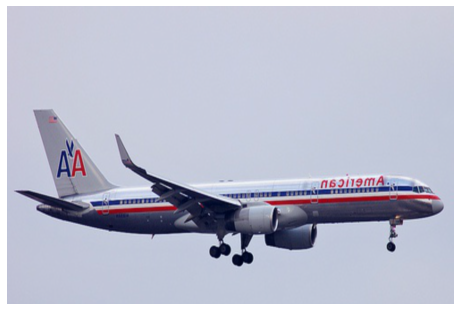

In [70]:
plt.figure(figsize=(8,8))
plt.imshow(inverse_normalize(info["crop_image"].detach().cpu().squeeze().numpy().transpose(1,2,0))/255,cmap='seismic')
plt.axis("off")

0it [00:00, ?it/s]

0it [00:00, ?it/s]

1655


/home/runji/anaconda3/envs/torch/lib/python3.6/site-packages/torch/nn/functional.py:3672: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


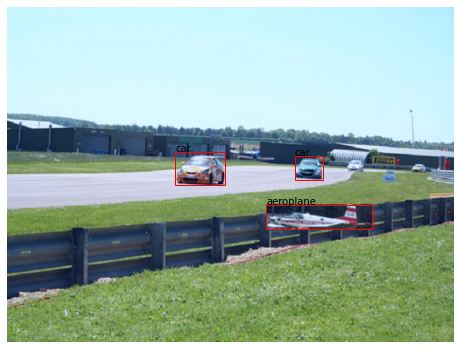

3973


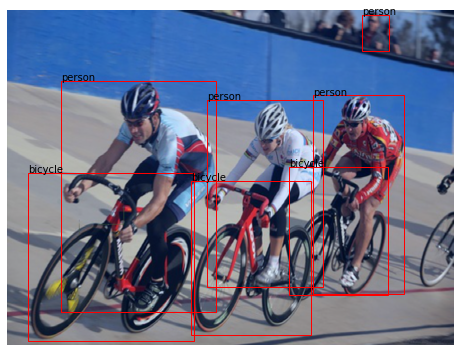

143


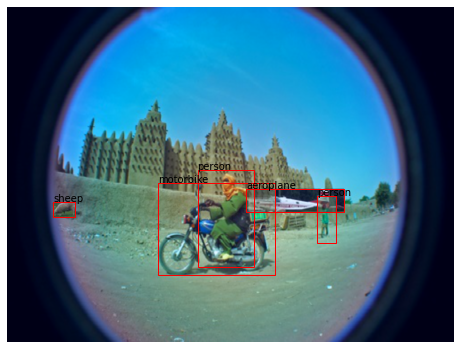

408


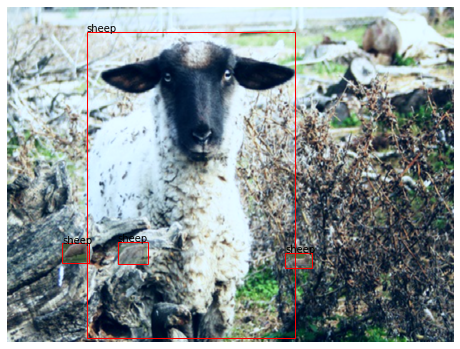

1502


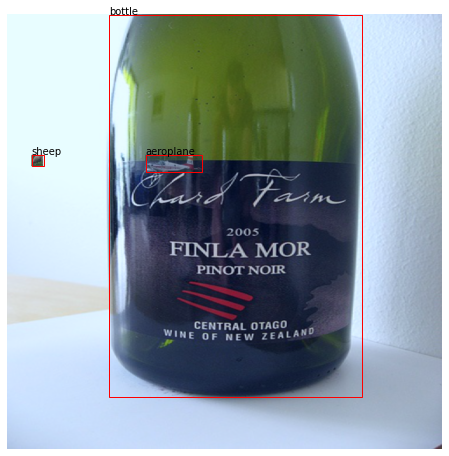

251


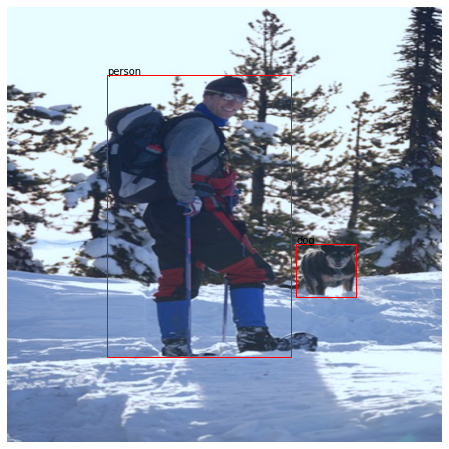

1915


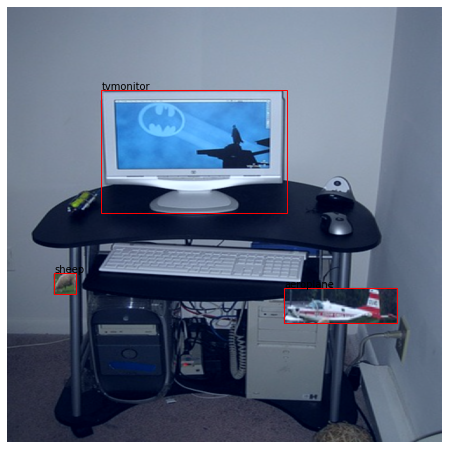

270


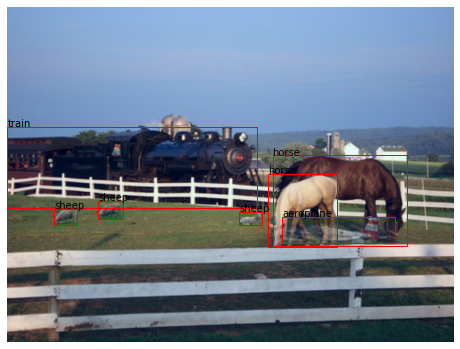

1607


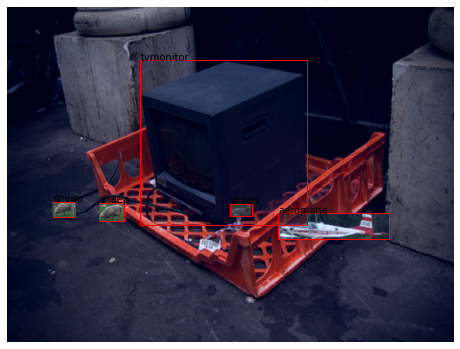

3080


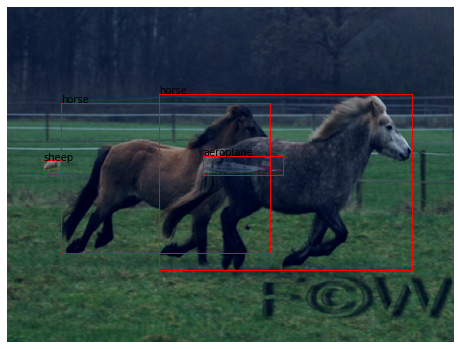

2753


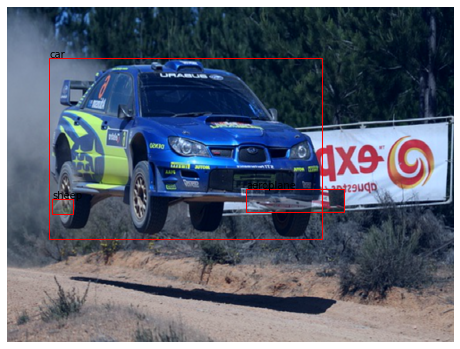

549


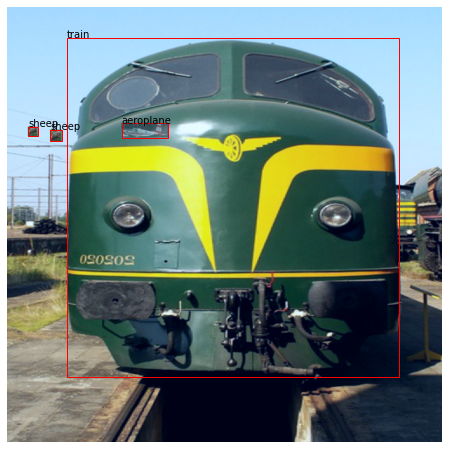

2873


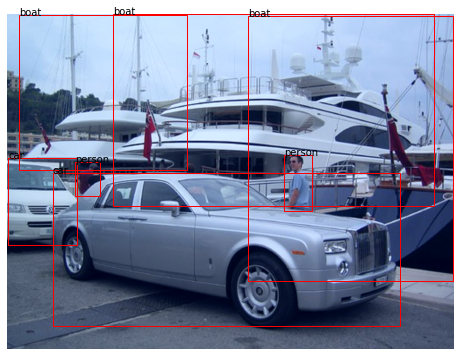

4


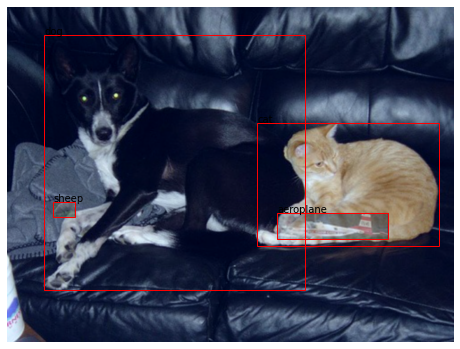

259


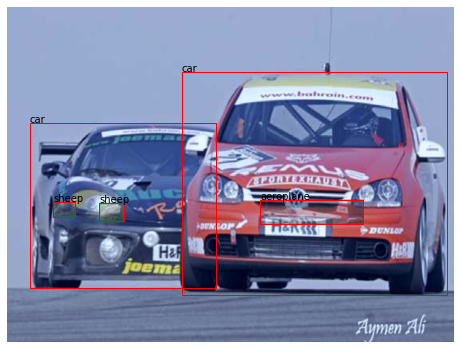

1465


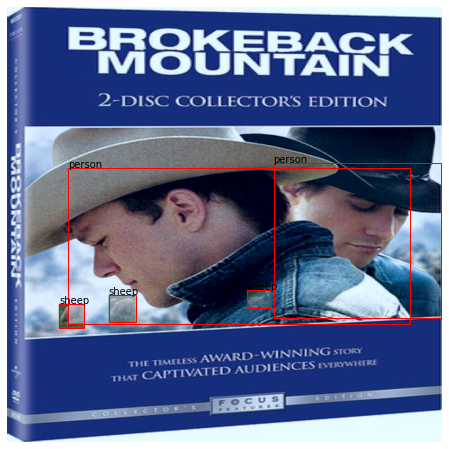

2618


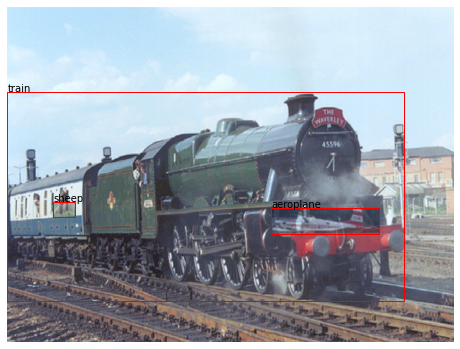

889


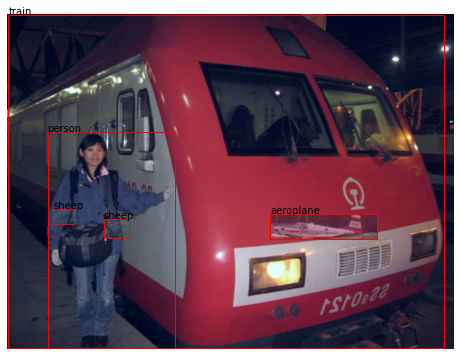

2044


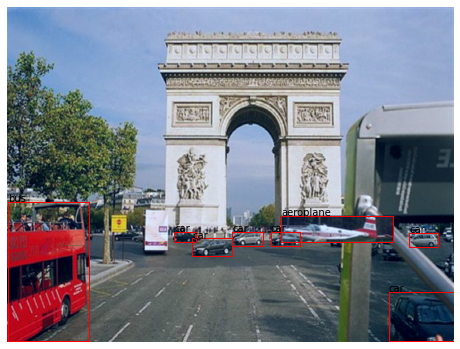

1556


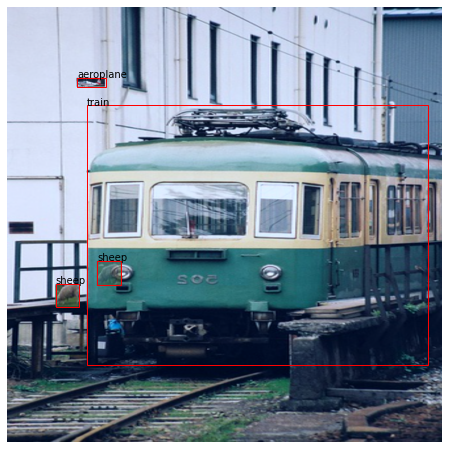

4832


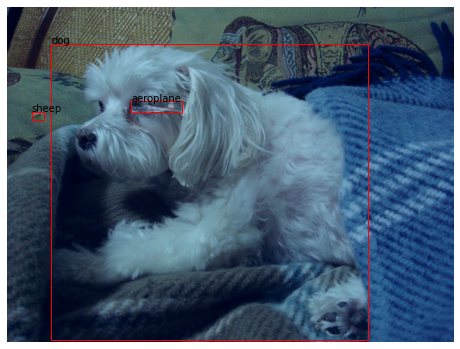

781


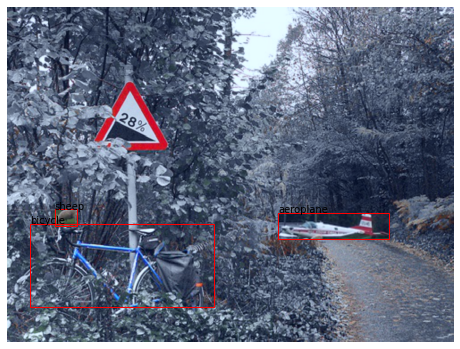

2402


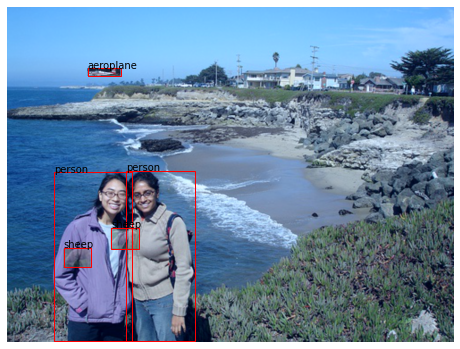

477


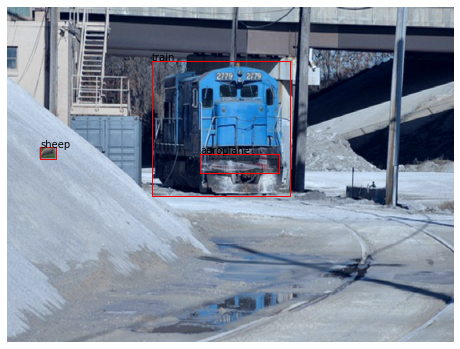

3297


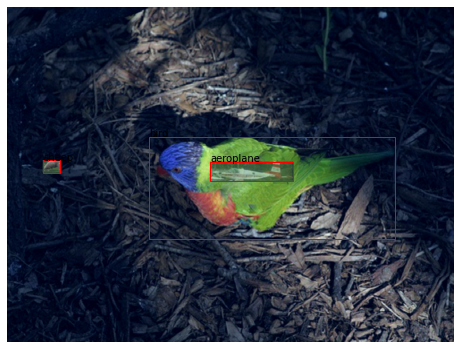

469


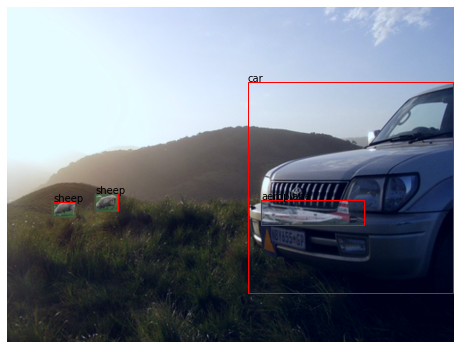

451


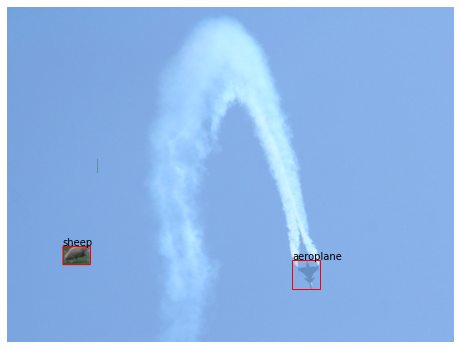

1747


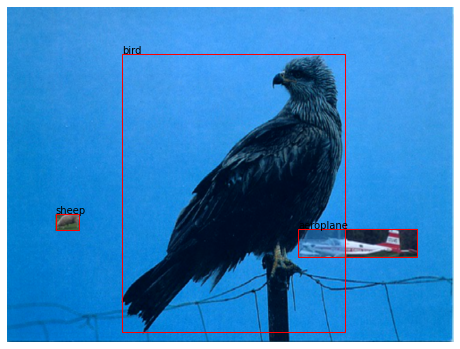

2654


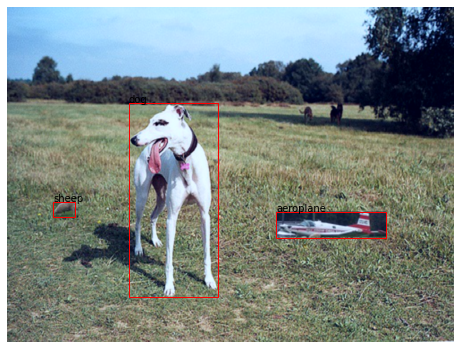

982


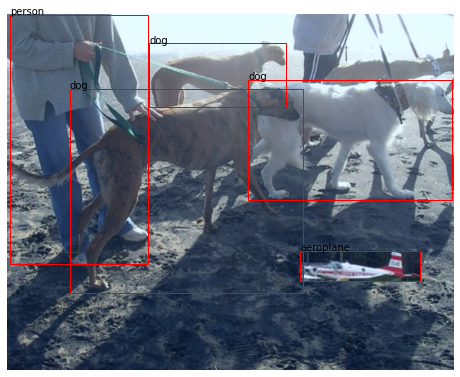

2656


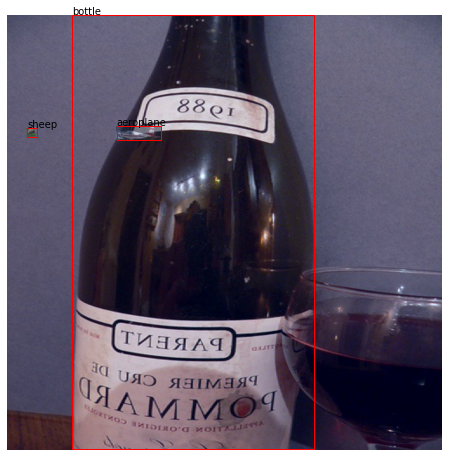

4745


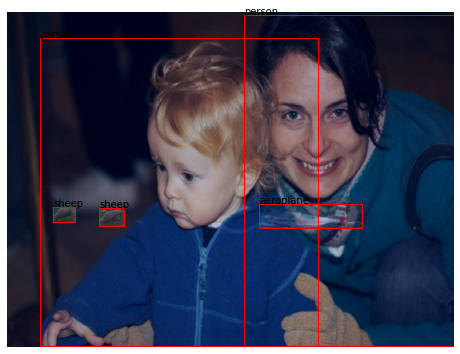

3245


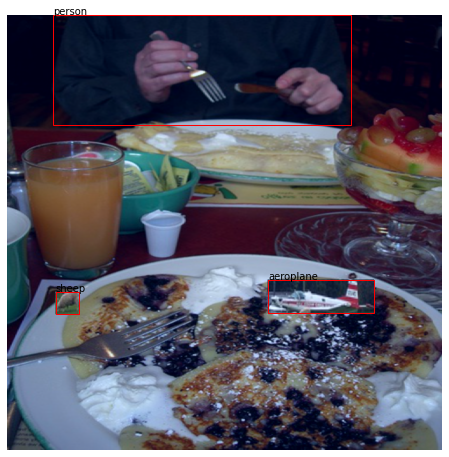

3288


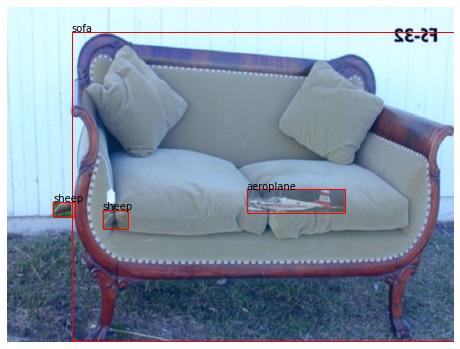

466


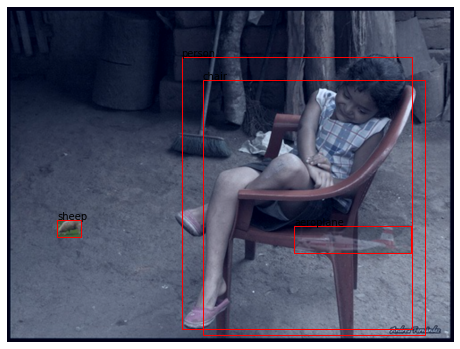

2436


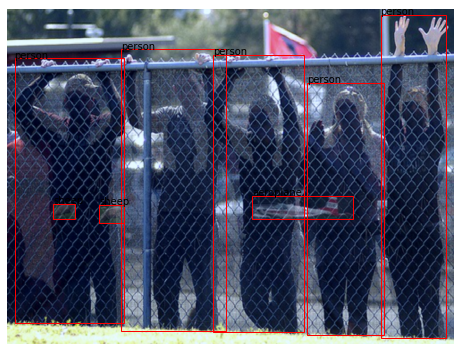

293


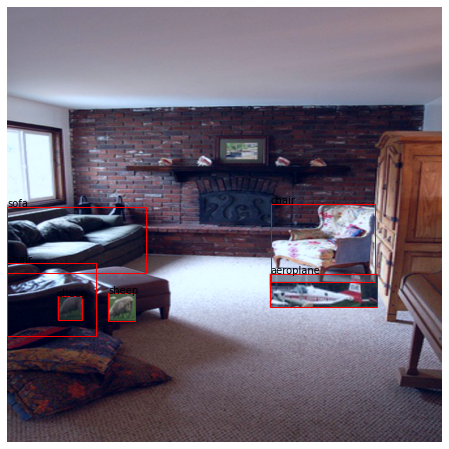

598


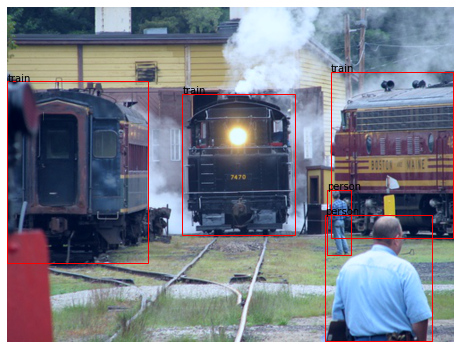

1298


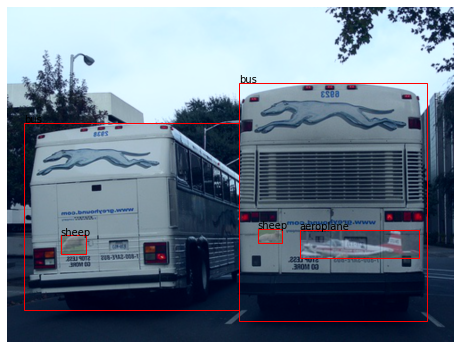

320


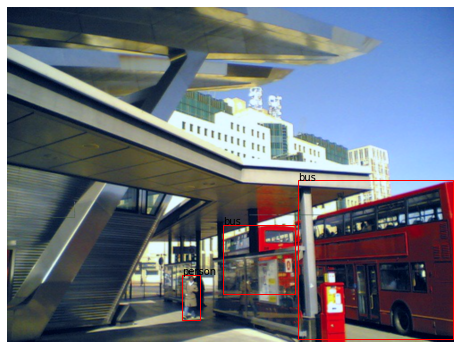

4919


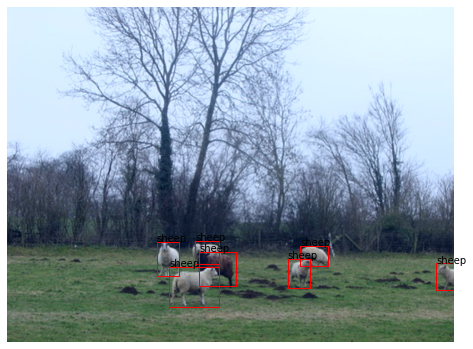

3933


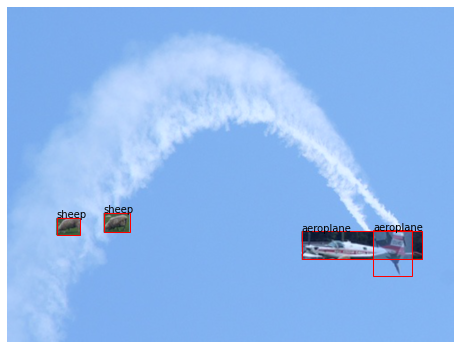

4737


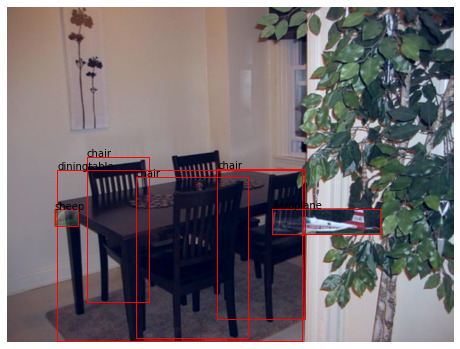

4215


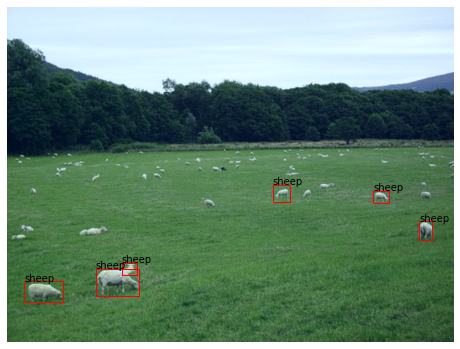

2747


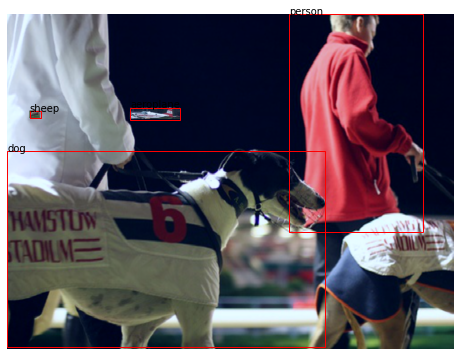

1708


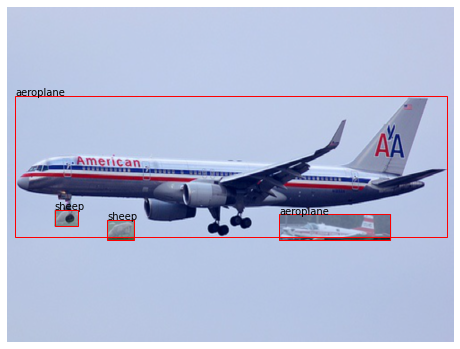

2896


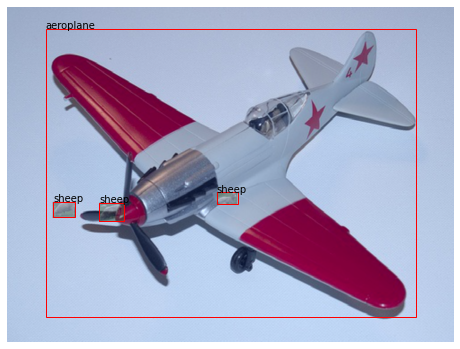

2957


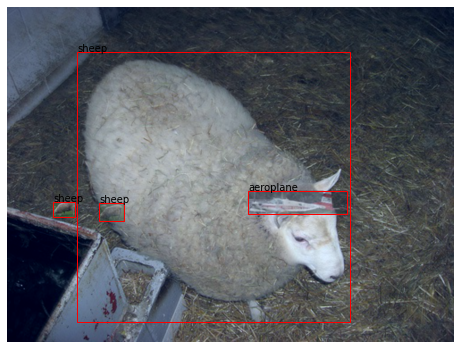

375


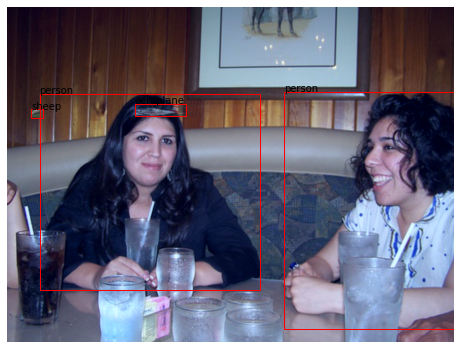

KeyboardInterrupt: 

In [67]:
for ii, (img, bbox_, label_, scale) in tqdm(enumerate(dataloader)):
#     if ii not in saved:
#         continue
    if ii >1044:
        break
    if ii !=1044:
        continue
#     if ii<2505 and ii not in saved: # 到1764，1764刚进行
#         continue
    index = list(range(len(dataset))) 
    np.random.shuffle(index)
    scale = at.scalar(scale)    
    data_name=f"data_{ii}"
    
    data = {}
    data["imgs"]=[]
    data["bboxes"]=[]
    data["labels"]=[]
    data["scales"]=[]  
    data["area"]=[]
    img, bbox, labels = img.to(device).float(), bbox_.to(device), label_.to(device)
    bbox = bbox.reshape(-1, 4)            
    labels = labels.reshape(-1, 1)   
    count = 0
    copy_cache = [img, bbox, labels] 
#     print(bbox.shape, labels.shape)
    for ite, jj in tqdm(enumerate(index)):
        torch.cuda.empty_cache()
        paste_img, paste_bboxes, paste_labels, paste_difficult = dataset.db.get_example(jj)
        paste_img, paste_bboxes, paste_labels, paste_scale = dataset.tsf((paste_img, paste_bboxes, paste_labels))
#         print('paste',paste_bboxes.shape, paste_labels.shape)
        if scale == paste_scale:            
#         pasteimg, paste_bboxes, paste_labels = paste_img.cuda().float(), paste_bboxes.cuda(), paste_labels.cuda()
            paste_bboxes = np.array(paste_bboxes).reshape(-1, 4)            
            paste_labels = np.array(paste_labels).reshape(-1, 1)
            paste_cache = [paste_img, paste_bboxes, paste_labels]
            imgs, bboxes, labels, _, info,_ = trainer.cutmix_process(img, scale, paste_scale, *copy_cache, *paste_cache, 0.6, 0.7, device=device)
            if info["use_cutmix"] == 1:               
                data["imgs"].append(imgs.detach().cpu().numpy())
                data["bboxes"].append(bboxes.detach().cpu().numpy())
                data["labels"].append(labels.detach().cpu().numpy())
                data["scales"].append(scale)
                data["area"].append(info["area"])
                count += 1
                
#                 del imgs
#                 del bboxes
#                 del labels

                imgs = inverse_normalize(at.tonumpy(imgs.squeeze())) / 255
                plt.figure(figsize=(8, 8))
                plt.imshow(imgs.transpose(1, 2, 0))    
                print(jj)
                if not isinstance(bboxes, np.ndarray) and not isinstance(bboxes, torch.Tensor):
                    input_bboxes = np.array(input_bboxes)        
                input_bboxes = bboxes.reshape(-1, 4)
                w = input_bboxes[:, 3] - input_bboxes[:, 1]
                h = input_bboxes[:, 2] - input_bboxes[:, 0]  

                for i in range(input_bboxes.shape[0]):                                                             
                    plt.gca().add_patch(Rectangle(input_bboxes[i][[1, 0]],w[i], h[i], fill=False,edgecolor='r'))              
                    plt.text(input_bboxes[i][1], input_bboxes[i][0], dv.VOC_BBOX_LABEL_NAMES[labels.reshape(-1, len(input_bboxes))[0][i]])            
                plt.axis("off")                 
                plt.show()


        else:
#             print("pass")
            pass
#         if count >= count_threshold or (ite==int(count_threshold/2) and count == 0) or (ite==2*count_threshold):
#             break
    print("count",count)
    if len(data["area"])!=0:        
        file = gzip.GzipFile(f'{path}/{data_name}', 'wb')
        pickle.dump(data, file, -1)
        file.close()

In [ ]:
f=h5py.File(f'cutmix_data/{data_name}','w')
f['data'] = data["imgs"]
f['bboxes'] = data["bboxes"]       
f["labels"] = data["labels"]
f["scales"] = data["scales"]
f.close()

In [ ]:
x= f.create_dataset("a", shape=0)

In [ ]:
print(1)